In [1]:
import os
import inspect
n_cores = 4
os.environ["XLA_FLAGS"] = '--xla_force_host_platform_device_count={}'.format(n_cores)

from jax import config
config.update("jax_enable_x64", True)
import meshio
import jax
import jax.numpy as jnp
import numpy as np
import pickle
from jax import jit, vmap, grad, jacrev
from jax.lax import cond, scan
import jax.random as random
key = random.PRNGKey(2022)
import jax.example_libraries.optimizers as optimizers
from jax.flatten_util import ravel_pytree
from jax.sharding import PositionalSharding
from functools import partial

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from PIL import Image
import pandas as pd

from utils import train, coords_2_strain_nn
from utils import train_colloc_parallel as train_colloc, init_params_nn, ff_nn, divergence, bd_forces, a1, a2, lr
from utils_hyperelasticity import NODE, init_layers, NODE_model_aniso, init_params_aniso, GOH_model, eval_Cauchy, eval_Cauchy_vmap, eval_P, eval_P_vmap
from utils_hyperelasticity import ThreeDElasticity
from fem import plotmesh, plotmesh_updated,fe_solver_2D, vahid_anisohyper_inv, apply_bc_biax

from jax_fem.core import FEM
from jax_fem.solver import solver
from jax_fem.utils import save_sol
from jax_fem.generate_mesh import box_mesh, get_meshio_cell_type, Mesh, rectangle_mesh

from PIL import Image, ImageFilter
from jaxinterp2d import interp2d

E_fun = vmap(lambda F: 0.5*(F.T@F - jnp.eye(2)))

       __       ___      ___   ___                _______  _______ .___  ___. 
      |  |     /   \     \  \ /  /               |   ____||   ____||   \/   | 
      |  |    /  ^  \     \  V  /      ______    |  |__   |  |__   |  \  /  | 
.--.  |  |   /  /_\  \     >   <      |______|   |   __|  |   __|  |  |\/|  | 
|  `--'  |  /  _____  \   /  .  \                |  |     |  |____ |  |  |  | 
 \______/  /__/     \__\ /__/ \__\               |__|     |_______||__|  |__| 
                                                                              



## 1. Generate data + pretraining

In [2]:
##########################################################################this is I am using to understand the above code##### skip it when you run the code
print(inspect.getsource(Mesh))

class Mesh():
    """
    A custom mesh manager might be better using a third-party library like
    meshio.
    """
    def __init__(self, points, cells, ele_type='TET4'):
        # TODO: Assert that cells must have correct orders
        # TODO: first cells, then points?
        self.points = points
        self.cells = cells
        self.ele_type = ele_type

    def count_selected_faces(self, location_fn):
        """Given location functions, compute the count of faces that satisfy
        the location function. Useful for setting up distributed load
        conditions.

        Parameters
        ----------
        location_fns : List[Callable]
            Callable: a function that inputs a point and returns a boolean
            value describing whether the boundary condition should be applied.

        Returns
        -------
        face_count : int
        """

        _, _, _, _, face_inds = get_face_shape_vals_and_grads(self.ele_type)
        cell_points = onp.take(self.point

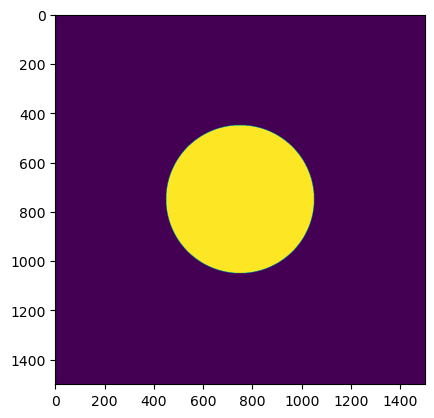

In [3]:
ele_type = 'QUAD4'
cell_type = get_meshio_cell_type(ele_type)
# Nx, Ny = 100, 100
# Lx, Ly = 1.0, 1.0
# meshio_mesh = rectangle_mesh(Nx=Nx, Ny=Ny, domain_x=Lx, domain_y=Ly)
# mesh = Mesh(meshio_mesh.points, meshio_mesh.cells_dict[cell_type])
image = Image.open('square_with_hole.png')
# image = image.filter(ImageFilter.GaussianBlur(radius=60))
plt.imshow(image)
image = image.rotate(-90)
image = np.array(image)
#image = image.mean(axis=2)
image = image/image.max()
if not np.all((image == 0) | (image == 1)):
    raise ValueError("Image must contain only 0s and 1s.")
pts_x = np.linspace(0,1,image.shape[0])
pts_y = np.linspace(0,1,image.shape[1])
const_params = jnp.array([0.5, 0.10, 0.20, 0.10, 0.0])

def coords_2_params_gt(xy):
    # xy ignored,  uniform material
    return const_params

In [4]:
GOH_P_vmap = vmap(ThreeDElasticity(GOH_model).ugrad_2_P, in_axes=(0, 0, None))
class HyperElasticity(FEM):
    def get_tensor_map(self):
        return lambda u_grad, params: ThreeDElasticity(GOH_model).ugrad_2_P(u_grad, params, self.dim)
    
    def set_params(self, params_vec):
        self.internal_vars['laplace'] = [params_vec]

In [5]:
##########################################################################this is I am using to understand the above code##### skip it when you run the code
print(GOH_model)
print(inspect.getsource(ThreeDElasticity))

<class 'utils_hyperelasticity.GOH_model'>
class ThreeDElasticity():
    def __init__(self, model):
        self.model = model

    def ugrad_2_P(self, u_grad, params, dim):
        theta = 0.0
        #Kinematics
        F_2D = u_grad + jnp.eye(dim)
        C_2D = F_2D.T @ F_2D
        Cinv_2D = jnp.linalg.inv(C_2D)
        detC_2D = jnp.linalg.det(C_2D)
        C33 = 1/detC_2D
        C = jnp.array([  [C_2D[0,0], C_2D[0,1], 0],\
                        [C_2D[1,0], C_2D[1,1], 0],\
                        [0,         0,       C33]])
        C2 = C @ C
        Cinv = jnp.linalg.inv(C)
        I1 = C[0,0] + C[1,1] + C[2,2]
        trC2 = C2[0,0] + C2[1,1] + C2[2,2]
        I2 = 0.5*(I1**2 - trC2)
        v0 = jnp.array([ jnp.cos(theta), jnp.sin(theta), 0])
        w0 = jnp.array([-jnp.sin(theta), jnp.cos(theta), 0])
        V0 = jnp.outer(v0, v0)
        W0 = jnp.outer(w0, w0)
        Iv = jnp.einsum('ij,ij',C,V0)
        Iw = jnp.einsum('ij,ij',C,W0)

        # Energy/Stress
        mode

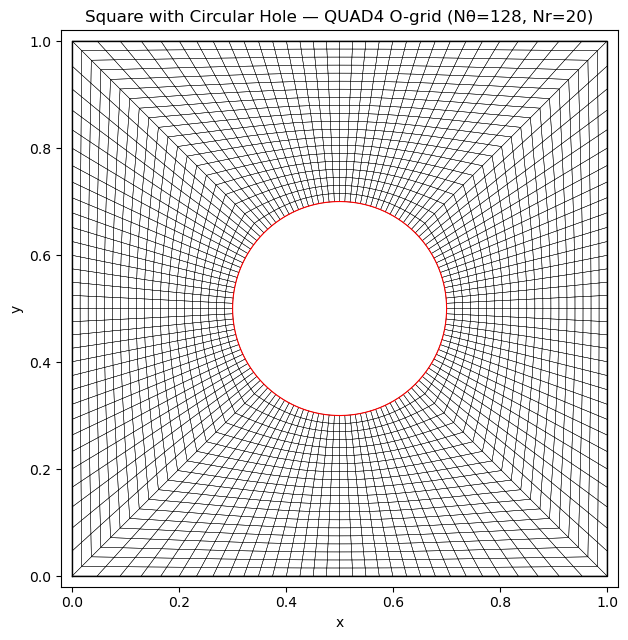

In [6]:

def ogrid_plate_with_hole(Ntheta=128, Nr=40, Lx=1.0, Ly=1.0, cx=0.5, cy=0.5, r=0.20):
    """
    Build a boundary-fitted QUAD4 O-grid for a square with a circular hole.
    Returns:
      points2d: (Npts, 2) float array
      quads   : (Ncells, 4) int array (CCW)
    """
    thetas = np.linspace(0.0, 2.0*np.pi, Ntheta, endpoint=False)

    # Ray-square intersection from (cx,cy) toward angle theta
    def hit_square(theta):
        dx, dy = np.cos(theta), np.sin(theta)
        eps = 1e-14
        hits = []
        if abs(dx) > eps:
            t = (0.0 - cx) / dx; y = cy + t*dy
            if t > 0 and -eps <= y <= Ly + eps: hits.append((t, 0.0, y))
            t = (Lx - cx) / dx; y = cy + t*dy
            if t > 0 and -eps <= y <= Ly + eps: hits.append((t, Lx,  y))
        if abs(dy) > eps:
            t = (0.0 - cy) / dy; x = cx + t*dx
            if t > 0 and -eps <= x <= Lx + eps: hits.append((t, x, 0.0))
            t = (Ly - cy) / dy; x = cx + t*dx
            if t > 0 and -eps <= x <= Lx + eps: hits.append((t, x,  Ly))
        tmin, bx, by = sorted(hits, key=lambda a: a[0])[0]
        return bx, by

    outer_pts = np.array([hit_square(th) for th in thetas])               
    inner_pts = np.column_stack([cx + r*np.cos(thetas), cy + r*np.sin(thetas)])  

    
    points2d = np.zeros(((Nr+1)*Ntheta, 2), dtype=float)
    for j in range(Ntheta):
        xi, yi = inner_pts[j]
        bx, by = outer_pts[j]
        for i in range(Nr+1):
            t = i / Nr
            points2d[i*Ntheta + j, 0] = (1.0 - t)*xi + t*bx
            points2d[i*Ntheta + j, 1] = (1.0 - t)*yi + t*by

    
    quads = []
    for i in range(Nr):
        for j in range(Ntheta):
            jn = (j + 1) % Ntheta
            n00 = i    * Ntheta + j
            n01 = i    * Ntheta + jn
            n11 = (i+1)* Ntheta + jn
            n10 = (i+1)* Ntheta + j
            quads.append([n00, n01, n11, n10])
    quads = np.asarray(quads, dtype=int)
    quads = quads[:, [0, 3, 2, 1]] 
    return points2d, quads


Lx, Ly = 1.0, 1.0
cx, cy = 0.5, 0.5
r      = 0.20 * min(Lx, Ly)


Ntheta = 128
Nr     = 20


pts2d, quads = ogrid_plate_with_hole(Ntheta, Nr, Lx, Ly, cx, cy, r)


pts3d = np.column_stack([pts2d, np.zeros(len(pts2d))])
meshio_mesh = meshio.Mesh(points=pts3d, cells=[("quad", quads)])


ele_type  = 'QUAD4'
def get_meshio_cell_type(ele_type):  
    return "quad" if ele_type == "QUAD4" else None

cell_type = get_meshio_cell_type(ele_type)
mesh = Mesh(meshio_mesh.points, meshio_mesh.cells_dict[cell_type])

print(mesh)  


plt.figure(figsize=(6.5, 6.5))
for q in quads:
    poly = np.vstack([pts2d[q], pts2d[q[0]]])  
    plt.plot(poly[:, 0], poly[:, 1], 'k-', lw=0.3)


plt.plot([0, Lx, Lx, 0, 0], [0, 0, Ly, Ly, 0], 'k-', lw=1.0)

th = np.linspace(0, 2*np.pi, 400)
plt.plot(cx + r*np.cos(th), cy + r*np.sin(th), 'r-', lw=0.8)

plt.gca().set_aspect('equal', 'box')
plt.xlim(-0.02, Lx + 0.02); plt.ylim(-0.02, Ly + 0.02)
plt.title(f"Square with Circular Hole — QUAD4 O-grid (Nθ={Ntheta}, Nr={Nr})")
plt.xlabel("x"); plt.ylabel("y")
plt.tight_layout()
plt.show()

In [ ]:
def collect_boundaries(points2d, Ntheta, Nr, Lx, Ly, atol=1e-10):
    # Ring indices (CCW in theta)
    outer_idx = np.arange(Nr * Ntheta, (Nr + 1) * Ntheta, dtype=int)
    hole_idx  = np.arange(0, Ntheta, dtype=int)

    X = points2d[:, 0]
    Y = points2d[:, 1]

    # Masks for each side on the outer ring
    left_m   = np.isclose(X[outer_idx], 0.0, atol=atol)
    right_m  = np.isclose(X[outer_idx], Lx,  atol=atol)
    bottom_m = np.isclose(Y[outer_idx], 0.0, atol=atol)
    top_m    = np.isclose(Y[outer_idx], Ly,  atol=atol)

    # Indices per side (sorted along the side)
    left   = outer_idx[left_m]
    right  = outer_idx[right_m]
    bottom = outer_idx[bottom_m]
    top    = outer_idx[top_m]

    # Sort by the varying coordinate to keep each side ordered nicely
    left   = left[np.argsort(Y[left])]         
    right  = right[np.argsort(Y[right])]       
    bottom = bottom[np.argsort(X[bottom])]     
    top    = top[np.argsort(X[top])]           

    # Optional sanity: ensure corners appear once per side (the masks already enforce that)
    boundaries = {
        "left":   left,
        "right":  right,
        "bottom": bottom,
        "top":    top,
        # full outer loop if you ever need it:
        "outer_ccw": outer_idx
    }
    hole = {
        "hole": hole_idx   # CCW in theta
    }
    return boundaries, hole

boundaries, hole = collect_boundaries(pts2d, Ntheta, Nr, Lx, Ly)

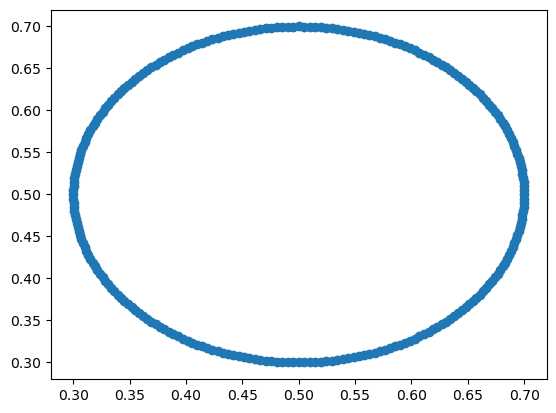

In [8]:
plt.scatter(pts2d[hole['hole'],0],pts2d[hole['hole'],1])

In [ ]:

ele_type = 'QUAD4'
cell_type = get_meshio_cell_type(ele_type)
mesh = Mesh(meshio_mesh.points[:, :2], meshio_mesh.cells_dict[cell_type])
print(mesh)

# Functions to identify the boundary nodes
def bottom(point):
    return jnp.isclose(point[1], 0., atol=1e-5)
def left(point):
    return jnp.isclose(point[0], 0., atol=1e-5)
def top(point):
    return jnp.isclose(point[1], Ly, atol=1e-5)
def right(point):
    return jnp.isclose(point[0], Lx, atol=1e-5)
def bottom_left(point):
    return jnp.logical_and(jnp.logical_and(bottom(point), left(point)), jnp.isclose(point[2], 0., atol=1e-5))


# Functions to assign dirichlet BCs
def zero_dirichlet(point):
    return 0.
def lmbx_max_dirichlet(point, lmbx_max):
    return Lx*lmbx_max - 1.0
def lmby_max_dirichlet(point, lmby_max):
    return Ly*lmby_max - 1.0



lmbx_hist = [1.02, 1.05, 1.10, 1.15]   
lmby_hist = [1.02, 1.05, 1.10, 1.15]   
 

F_hist_goh = []
P_hist_goh = []
u_hist_goh=[]
for lmbx, lmby in zip(lmbx_hist, lmby_hist):
    dirichlet_bc_info = [
        [bottom,            left,           top,                                 right                              ],
        [1,                 0,              1,                                   0                                  ],
        [zero_dirichlet,    zero_dirichlet, lambda p, lmby=lmby: lmby_max_dirichlet(p, lmby),
                                           lambda p, lmbx=lmbx: lmbx_max_dirichlet(p, lmbx)]
    ]
    problem = HyperElasticity(mesh,
                            vec=2,
                            dim=2,
                            ele_type=ele_type,
                            dirichlet_bc_info=dirichlet_bc_info)
    elem_X = problem.get_physical_quad_points().mean(1)

    # params = vmap(coords_2_params_gt)(elem_X)
    params = []
    for xy in elem_X:
        params.append(coords_2_params_gt(xy))
    params = np.expand_dims(params, 1)
    params_vec = jnp.repeat(params, axis=1, repeats=4)
    problem.set_params(params_vec)


    u = solver(problem, use_petsc=True)
    middle_displacements = []
    for element in mesh.cells:
       element_displacements = u[element,:]
       middle_displacements.append(np.mean(element_displacements, axis=0))
    u_hist_goh.append(np.array(middle_displacements))
    u_grad = np.mean(problem.sol_to_grad(u), axis=1)
    F = u_grad + np.eye(2)

    P = GOH_P_vmap(u_grad, params_vec[:,0,:], 2)
    
    F_hist_goh.append(F)
    P_hist_goh.append(P)
F_hist_goh = np.array(F_hist_goh)
P_hist_goh = np.array(P_hist_goh)
u_hist_goh = np.array(u_hist_goh)

[10-12 01:10:28][DEBUG] jax_fem: Computing shape function values, gradients, etc.
[10-12 01:10:28][DEBUG] jax_fem: ele_type = QUAD4, quad_points.shape = (num_quads, dim) = (4, 2)
[10-12 01:10:28][DEBUG] jax_fem: face_quad_points.shape = (num_faces, num_face_quads, dim) = (4, 2, 2)


[10-12 01:10:29][DEBUG] jax_fem: Done pre-computations, took 0.8291375637054443 [s]
[10-12 01:10:29][INFO] jax_fem: Solving a problem with 5120 cells, 5376x2 = 10752 dofs.
[10-12 01:10:29][DEBUG] jax_fem: Calling the row elimination solver for imposing Dirichlet B.C.
[10-12 01:10:29][DEBUG] jax_fem: Start timing
[10-12 01:10:29][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[10-12 01:10:31][DEBUG] jax_fem: Function split_and_compute_cell took 1.3661 seconds
[10-12 01:10:32][DEBUG] jax_fem: Creating sparse matrix with scipy...
[10-12 01:10:32][DEBUG] jax_fem: Linear guess solve...
[10-12 01:10:32][DEBUG] jax_fem: PETSc - Solving with ksp_type = bcgsl, pc = ilu
[10-12 01:10:33][DEBUG] jax_fem: PETSc linear solve res = 9.67378385127909e-07
[10-12 01:10:33][DEBUG] jax_fem: Computing cell Jacobian and cell residual...
[10-12 01:10:33][DEBUG] jax_fem: Function split_and_compute_cell took 0.0917 seconds
[10-12 01:10:33][DEBUG] jax_fem: Creating sparse matrix with scipy...
[10-1

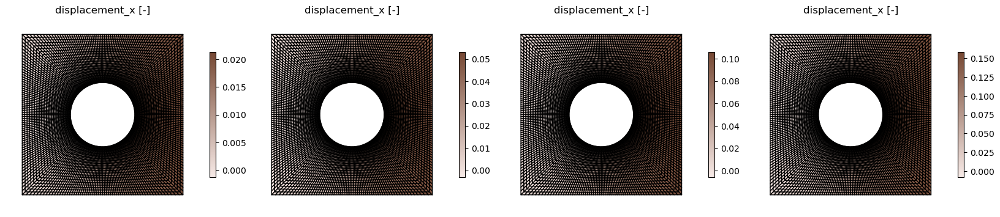

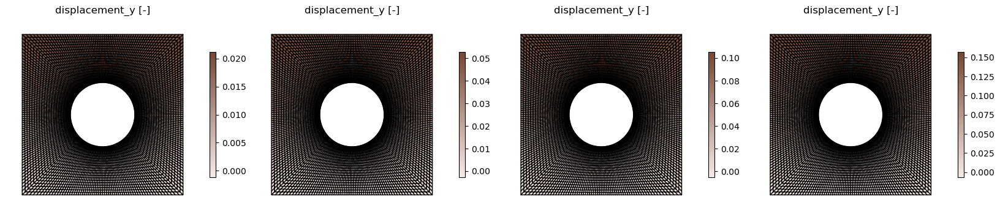

In [ ]:
displacements = [] 
natural_brown_cmap = LinearSegmentedColormap.from_list(
    "natural_brown",
    [ "#f7eae7", "#754732" ],  
    N=256)
t_hist = np.arange(len(u_hist_goh))

n_plots = len(u_hist_goh)  
n_cols = 5
n_rows = (n_plots + n_cols - 1) // n_cols 

fig_x, axes_x = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
fig_y, axes_y = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))

axes_x = axes_x.flatten()
axes_y = axes_y.flatten()

for idx, (lmb_i, t, u) in enumerate(zip(lmbx_hist, t_hist, u_hist_goh)):
    key = random.PRNGKey(t)
    noise = jax.random.normal(key, shape=u.shape)
    mu=0
    sigma=0.0005
    noise=mu + sigma * noise
    noise_scale = 0
    u_noisy = u + noise_scale * noise
    u_noisy_x = u_noisy[:, [0]].flatten()
    u_noisy_y = u_noisy[:, [1]].flatten()

    ax_x = axes_x[idx]
    plotmesh(mesh.cells, mesh.points, u_noisy_x, title=f'displacement_x [-]', ax=ax_x, cmap=natural_brown_cmap )

    ax_y = axes_y[idx]
    plotmesh(mesh.cells, mesh.points, u_noisy_y, title=f'displacement_y [-]', ax=ax_y, cmap=natural_brown_cmap)

    displacements.append(np.array([t * np.ones(len(u)), u_noisy[:, 0], u_noisy[:, 1]]))

for i in range(n_plots, len(axes_x)):
    fig_x.delaxes(axes_x[i])
for i in range(n_plots, len(axes_y)):
    fig_y.delaxes(axes_y[i])

fig_x.tight_layout()
fig_y.tight_layout()

plt.show()

displacements = np.hstack(displacements)


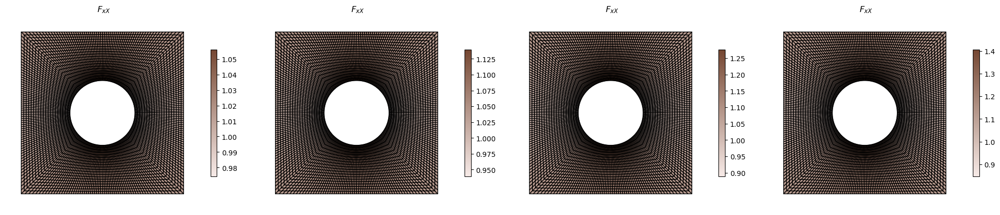

In [ ]:

fig, axes = plt.subplots(1,4,figsize=(25,8))
for t, F_t in zip(t_hist, F_hist_goh):
    F=F_t[:,0,0]
    if t < 5:
        plotmesh(mesh.cells, mesh.points, F, title=r' $F_{xX}$', ax=axes[t],cmap=natural_brown_cmap)
    



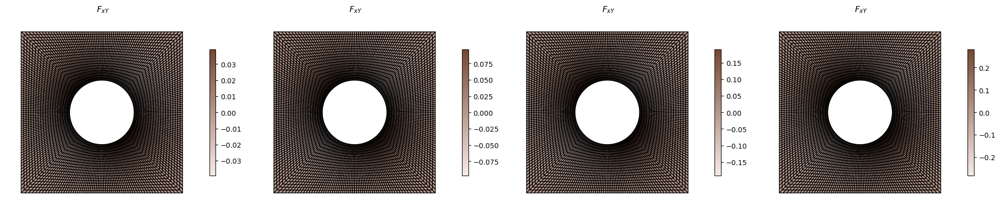

In [17]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t, F_t in zip(t_hist, F_hist_goh):
    F=F_t[:,0,1]
    if t < 5:
        plotmesh(mesh.cells, mesh.points, F, title=r' $F_{xY}$', ax=axes[t],cmap=natural_brown_cmap); 

    

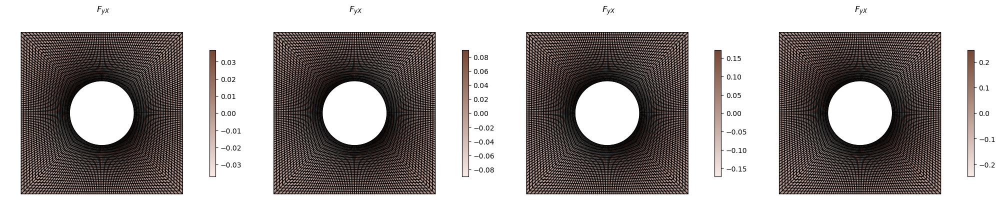

In [18]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t, F_t in zip(t_hist, F_hist_goh):
    F=F_t[:,1,0]
    if t < 5:
        plotmesh(mesh.cells, mesh.points, F, title=r' $F_{yX}$', ax=axes[t],cmap=natural_brown_cmap); 

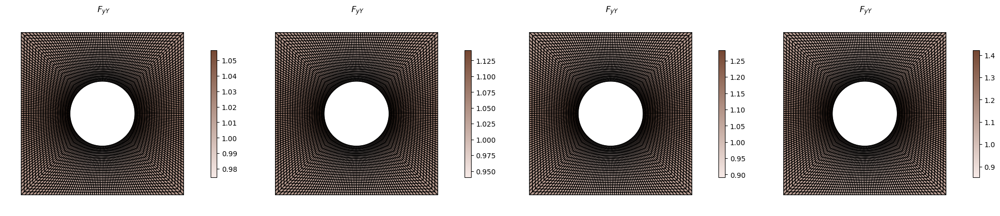

In [19]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t, F_t in zip(t_hist, F_hist_goh):
    F=F_t[:,1,1]
    if t < 5:
        plotmesh(mesh.cells, mesh.points, F, title=r' $F_{yY}$', ax=axes[t],cmap=natural_brown_cmap); 

(5120, 2)
(5120, 2)
(5120, 2)
(5120, 2)


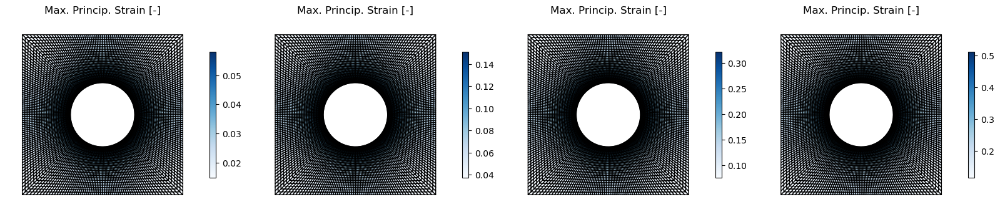

In [30]:
fig, axes = plt.subplots(1,4,figsize=(20,4))
strains = []
t_hist = np.arange(len(lmbx_hist))
for t, F, P, ax in zip(t_hist, F_hist_goh, P_hist_goh, axes):
    E = E_fun(F)
    evals, efuns = jnp.linalg.eigh(E)
    print(evals.shape)
    E_11, E_22 = evals.T

    mps = np.maximum(E_11, E_22)
    plotmesh(mesh.cells, mesh.points, mps, title='Max. Princip. Strain [-]', ax=ax); 

    strains.append(np.array([t*np.ones(len(F)), F[:,0,0], F[:,0,1], F[:,1,0], F[:,1,1]]))
strains = np.hstack(strains)

### Coords_2_strain NN

In [30]:
# instead of using a 2D spline, use a NN to get the strain field for a given (x,y)
def loss_coords_2_strain(params, X, key):
    inp, out_gt = X[:,:3], X[:,3:] #inp: x,y,lmb and out_gt=eps_xx, eps_yy
    t = inp[:,2:3]
    out_pr = coords_2_strain_nn(inp, params)
    out_gt = out_gt/(t+1) #dividing by t+1 just for some regularization
    out_pr = out_pr/(t+1) #dividing by t+1 just for some regularization
    return jnp.mean((out_pr-out_gt)**2)

n_ff = 40 # 10 cosines and 10 sines in the fourier features
n_inp = 2 # x, y
ff_params = np.random.normal(size=n_inp*n_ff).reshape([n_inp,n_ff])*0.5
nn_layers = [2*n_ff+1,40,40,4]
nn_params = init_params_nn(nn_layers, key)
coord_2_strain_params = [ff_params, nn_params]

opt_init, opt_update, get_params = optimizers.adam(5.e-4)
opt_state = opt_init(coord_2_strain_params)

X = np.vstack([elem_X, elem_X, elem_X, elem_X])
inp = np.hstack([X, strains.T])
coord_2_strain_params, train_loss, _ = train(loss_coords_2_strain, inp, get_params, opt_update, opt_state, key, nIter = 100000, print_freq=1000, batch_size=1000)

it 1000, train loss = 1.388807e-04
it 2000, train loss = 6.715121e-05
it 3000, train loss = 3.924910e-05
it 4000, train loss = 2.461413e-05
it 5000, train loss = 1.858411e-05
it 6000, train loss = 1.157187e-05
it 7000, train loss = 9.251205e-06
it 8000, train loss = 8.161857e-06
it 9000, train loss = 5.729685e-06
it 10000, train loss = 5.184975e-06
it 11000, train loss = 4.213379e-06
it 12000, train loss = 5.171541e-06
it 13000, train loss = 4.086084e-06
it 14000, train loss = 3.158324e-06
it 15000, train loss = 2.753526e-06
it 16000, train loss = 2.464034e-06
it 17000, train loss = 3.928647e-06
it 18000, train loss = 2.324882e-06
it 19000, train loss = 3.665057e-06
it 20000, train loss = 2.195624e-06
it 21000, train loss = 2.123289e-06
it 22000, train loss = 3.085555e-06
it 23000, train loss = 2.387355e-06
it 24000, train loss = 1.644405e-06
it 25000, train loss = 2.353212e-06
it 26000, train loss = 2.303404e-06
it 27000, train loss = 1.594329e-06
it 28000, train loss = 1.659703e-06
i

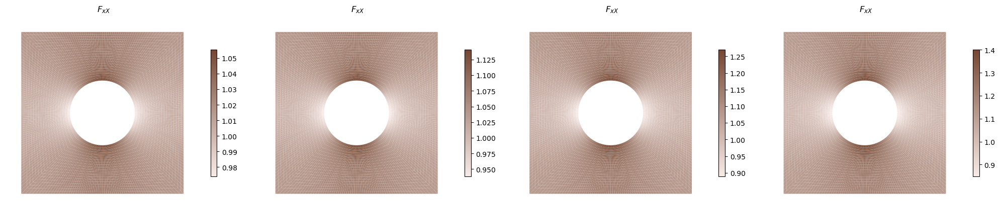

In [31]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t in t_hist:
    ax = axes[t]
    aux = np.hstack([elem_X, t*np.ones_like(elem_X[:,:1])])
    F_xx, _, _, _ = coords_2_strain_nn(aux, coord_2_strain_params).T
    plotmesh(mesh.cells, mesh.points, F_xx, title=r' $F_{xX}$', ax=axes[t],ec='None', cmap=natural_brown_cmap); 

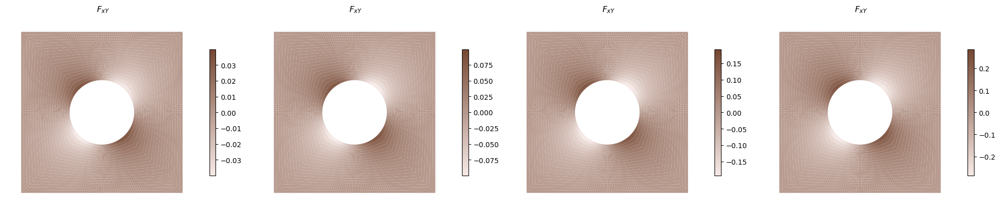

In [32]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t in t_hist:
    ax = axes[t]
    aux = np.hstack([elem_X, t*np.ones_like(elem_X[:,:1])])
    _, F_xy, _, _ = coords_2_strain_nn(aux, coord_2_strain_params).T
    plotmesh(mesh.cells, mesh.points, F_xy, title=r' $F_{xY}$', ax=axes[t],ec='None',cmap=natural_brown_cmap); 

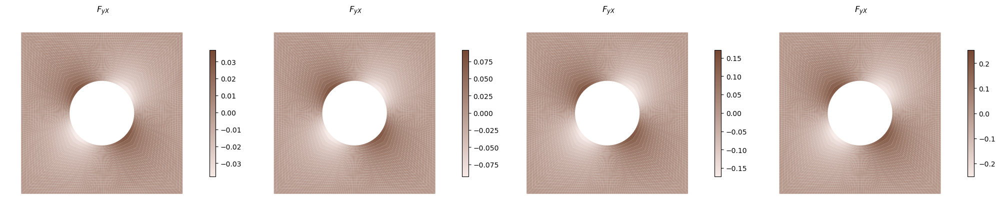

In [33]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t in t_hist:
    ax = axes[t]
    aux = np.hstack([elem_X, t*np.ones_like(elem_X[:,:1])])
    _, _, F_yx, _ = coords_2_strain_nn(aux, coord_2_strain_params).T
    plotmesh(mesh.cells, mesh.points, F_yx, title=r' $F_{yX}$', ax=axes[t],ec='None',cmap=natural_brown_cmap); 

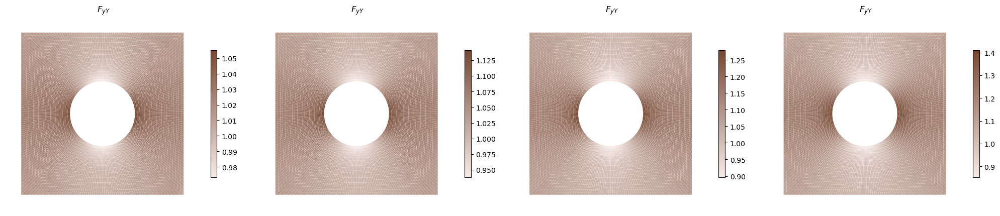

In [34]:
fig, axes = plt.subplots(1,4,figsize=(25,8))
for t in t_hist:
    ax = axes[t]
    aux = np.hstack([elem_X, t*np.ones_like(elem_X[:,:1])])
    _, _, _, F_yy = coords_2_strain_nn(aux, coord_2_strain_params).T
    plotmesh(mesh.cells, mesh.points, F_yy, title=r' $F_{yY}$', ax=axes[t],ec='None', cmap=natural_brown_cmap); 

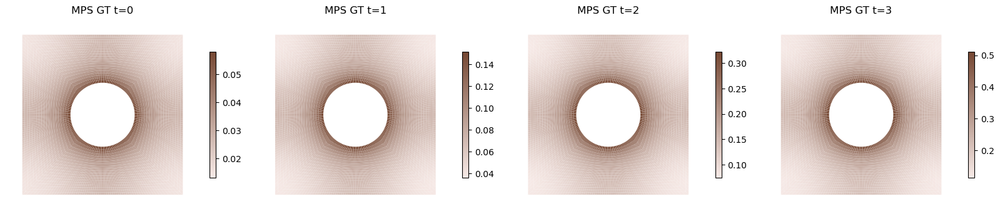

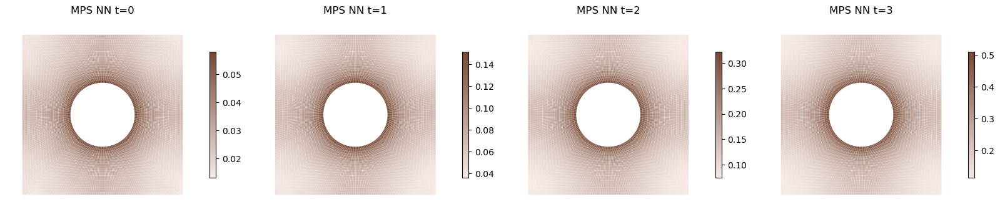

In [ ]:
def max_principal_strain(F):
    E = E_fun(F)                        
    evals, _ = jnp.linalg.eigh(E)        
    E_11, E_22 = evals.T
    return np.asarray(np.maximum(E_11, E_22))  

mps_gt_list = []   
mps_nn_list = []

# Ground truth row
for t, F, P in zip(t_hist, F_hist_goh, P_hist_goh):
    mps_gt_list.append(max_principal_strain(F))   # F shape (Ne,2,2)

for t in t_hist:
    aux = np.hstack([elem_X, t*np.ones_like(elem_X[:, :1])])   # (Ne, 3)
    F_xx, F_xy, F_yx, F_yy = coords_2_strain_nn(aux, coord_2_strain_params).T
    F_rec = np.stack([F_xx, F_xy, F_yx, F_yy]).T.reshape([-1, 2, 2])
    mps_nn_list.append(max_principal_strain(F_rec))

mps_gt_list = [np.asarray(x) for x in mps_gt_list]
mps_nn_list = [np.asarray(x) for x in mps_nn_list]
n_cols      = len(mps_gt_list) 

col_ranges = []
for c in range(n_cols):
    vmin = min(np.min(mps_gt_list[c]), np.min(mps_nn_list[c]))
    vmax = max(np.max(mps_gt_list[c]), np.max(mps_nn_list[c]))

    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmin == vmax:
        vmin, vmax = 0.0, 1.0
    col_ranges.append((vmin, vmax))


range_minmax_pr = np.array([x for rng in col_ranges for x in rng])

fig, axes = plt.subplots(1, n_cols, figsize=(5*n_cols, 4))
for c, ax in enumerate(axes):
    vmin, vmax = col_ranges[c]
    plotmesh_updated(mesh.cells, mesh.points, mps_gt_list[c],
                     vmin, vmax, title=f'MPS GT t={t_hist[c]}', ax=ax, ec='none',cmap=natural_brown_cmap)

fig, axes = plt.subplots(1, n_cols, figsize=(5*n_cols, 4))
for c, ax in enumerate(axes):
    vmin, vmax = col_ranges[c]
    plotmesh_updated(mesh.cells, mesh.points, mps_nn_list[c],
                     vmin, vmax, title=f'MPS NN t={t_hist[c]}', ax=ax, ec='none',cmap=natural_brown_cmap)
plt.show()

In [ ]:
Lx, Ly = 1.0, 1.0
atol = 1e-8

# ensure 2D coords
pts = mesh.points[:, :2]
conn = mesh.cells  # (Ne, 4)

# local edge pairs (0-1, 1-2, 2-3, 3-0)
edge_pairs = np.array([[0,1],[1,2],[2,3],[3,0]], dtype=int)

# outputs
rgt_bd_elems, top_bd_elems, lft_bd_elems, bot_bd_elems = [], [], [], []
rgt_bd_lengths, top_bd_lengths, lft_bd_lengths, bot_bd_lengths = [], [], [], []

for ei, e in enumerate(conn):
    xy_e = pts[e]                               
    p0 = xy_e[edge_pairs[:,0]]                  
    p1 = xy_e[edge_pairs[:,1]]                  
    mid = 0.5 * (p0 + p1)                       

    dx = np.abs(p1[:,0] - p0[:,0])              
    dy = np.abs(p1[:,1] - p0[:,1])              

    
    ks = np.where(np.isclose(mid[:,0], Lx, atol=atol))[0]
    for k in ks:
        rgt_bd_elems.append(ei)
        rgt_bd_lengths.append(dy[k])

    
    ks = np.where(np.isclose(mid[:,0], 0.0, atol=atol))[0]
    for k in ks:
        lft_bd_elems.append(ei)
        lft_bd_lengths.append(dy[k])

    
    ks = np.where(np.isclose(mid[:,1], Ly, atol=atol))[0]
    for k in ks:
        top_bd_elems.append(ei)
        top_bd_lengths.append(dx[k])

    
    ks = np.where(np.isclose(mid[:,1], 0.0, atol=atol))[0]
    for k in ks:
        bot_bd_elems.append(ei)
        bot_bd_lengths.append(dx[k])

# convert to arrays (optional)
rgt_bd_elems   = np.asarray(rgt_bd_elems,   dtype=int)
top_bd_elems   = np.asarray(top_bd_elems,   dtype=int)
lft_bd_elems   = np.asarray(lft_bd_elems,   dtype=int)
bot_bd_elems   = np.asarray(bot_bd_elems,   dtype=int)

rgt_bd_lengths = np.asarray(rgt_bd_lengths, dtype=float)
top_bd_lengths = np.asarray(top_bd_lengths, dtype=float)
lft_bd_lengths = np.asarray(lft_bd_lengths, dtype=float)
bot_bd_lengths = np.asarray(bot_bd_lengths, dtype=float)

In [ ]:
print('rgt_bd_elems_shear_traction',np.sum(P_hist_goh[:,rgt_bd_elems,1,0]*rgt_bd_lengths, axis=1))
print('lft_bd_elems_shear_traction',np.sum(P_hist_goh[:,lft_bd_elems,1,0]*lft_bd_lengths , axis=1))
print('top_bd_elems_shear_traction',np.sum(P_hist_goh[:,top_bd_elems,0,1]*top_bd_lengths, axis=1))
print('bot_bd_elems_shear_traction',np.sum(P_hist_goh[:,bot_bd_elems,0,1]*bot_bd_lengths, axis=1))

rgt_bd_frc = np.sum(P_hist_goh[:,rgt_bd_elems,0,0]*rgt_bd_lengths, axis=1)
lft_bd_frc = np.sum(P_hist_goh[:,lft_bd_elems,0,0]*lft_bd_lengths , axis=1)
top_bd_frc = np.sum(P_hist_goh[:,top_bd_elems,1,1]*top_bd_lengths, axis=1)
bot_bd_frc = np.sum(P_hist_goh[:,bot_bd_elems,1,1]*bot_bd_lengths, axis=1)
Force_x = jnp.array(0.5*(rgt_bd_frc + lft_bd_frc))
Force_y = jnp.array(0.5*(top_bd_frc + bot_bd_frc))

#get the points of the elements
rgt_bd_X = elem_X[rgt_bd_elems]
top_bd_X = elem_X[top_bd_elems]
lft_bd_X = elem_X[lft_bd_elems]
bot_bd_X = elem_X[bot_bd_elems]
bd_X = rgt_bd_X, top_bd_X, lft_bd_X, bot_bd_X

rgt_bd_elems_shear_traction [ 0. -0.  0.  0.]
lft_bd_elems_shear_traction [-0. -0.  0.  0.]
top_bd_elems_shear_traction [-0. -0.  0. -0.]
bot_bd_elems_shear_traction [-0. -0.  0. -0.]


In [16]:
print(Force_x)
print(Force_y)

[0.07573 0.17944 0.33194 0.46622]
[0.07311 0.17229 0.31552 0.43809]


In [ ]:
# Homogenize the strains
F_xx_mean = np.mean(F_hist_goh[:,:,0,0], axis=1)
F_xy_mean = np.mean(F_hist_goh[:,:,0,1], axis=1)
F_yx_mean = np.mean(F_hist_goh[:,:,1,0], axis=1)
F_yy_mean = np.mean(F_hist_goh[:,:,1,1], axis=1)

P_xx_mean = Force_x/Ly
P_yy_mean = Force_y/Lx
inputs = np.array([F_xx_mean, F_xy_mean, F_yx_mean, F_yy_mean, P_xx_mean, P_yy_mean]).T

n_neurons = 4
# Define the loss function for when training all params
@jit
def loss_stress(params, x, key):
    model = NODE_model_aniso(params)
    F_xx, F_xy, F_yx, F_yy, P_xx_gt, P_yy_gt = x.T
    P = eval_P_vmap(F_xx, F_xy, F_yx, F_yy, model)
    P_xx_pr, P_yy_pr = P[:,0,0], P[:,1,1]
    return np.mean((P_xx_pr-P_xx_gt)**2+(P_yy_pr-P_yy_gt)**2)

# Initialize NODEs and the optimizer
key = random.PRNGKey(0)
common_layers = [1, n_neurons, n_neurons]
sample_layers = [n_neurons,1]
node_params = init_params_aniso(common_layers, sample_layers, key)
opt_init, opt_update, get_params = optimizers.adam(5.e-4) #Original: 1.e-4
opt_state = opt_init(node_params)

# Train
node_params, train_loss, _ = train(loss_stress, inputs, get_params, opt_update, opt_state, key, nIter = 20000, print_freq=1000)

In [18]:
#print(inspect.getsource(NODE_model_aniso))
print(type(node_params[0]))
print(inputs.shape)#Λ 
print(common_layers )
print(sample_layers)

<class 'tuple'>
(4, 6)
[1, 4, 4]
[4, 1]


In [19]:
mymodel = NODE_model_aniso(node_params)
P = eval_P_vmap(F_xx_mean, F_xy_mean, F_yx_mean, F_yy_mean, mymodel)
P_xx_pr, P_yy_pr = P[:,0,0], P[:,1,1]
print('gt P_xx & P_yy: ', P_xx_mean, P_yy_mean)
print('pr P_xx & P_yy: ', P_xx_pr, P_yy_pr)

gt P_xx & P_yy:  [0.07573 0.17944 0.33194 0.46622] [0.07311 0.17229 0.31552 0.43809]
pr P_xx & P_yy:  [0.07403 0.1806  0.33163 0.46626] [0.07143 0.17346 0.31514 0.43817]


In [42]:
# Fit a function Λ that maps x,y ∈ [0,1] to the individual-specific parameters of this NODE with a maximum variance of, say, 1%
phi, unravel = ravel_pytree(node_params)
n_phi = len(phi)

# ff_params = coord_2_sΛ train_params[0]
# ff_nn2 = lambda x, nn_params: ff_nn(x, [ff_params, nn_params])
def loss_Lambda(params, inp, key):
    out_pr = ff_nn(inp, params)
    return jnp.mean((out_pr-phi)**2)

n_ff = 40
ff_params = np.random.normal(size=2*n_ff).reshape([2,n_ff])
nn_layers = [2*n_ff,40,40,n_phi]
nn_params = init_params_nn(nn_layers, key)
Lambda_params = [ff_params, nn_params]
opt_init, opt_update, get_params = optimizers.adam(5.e-4) #Original: 1.e-4
opt_state = opt_init(Lambda_params)

inp = np.array(np.meshgrid(np.linspace(0,1,20), np.linspace(0,1,20))).reshape([2,-1]).T
Lambda_params, train_loss, _ = train(loss_Lambda, inp, get_params, opt_update, opt_state, key, nIter = 10000, print_freq=1000)

it 1000, train loss = 1.272164e-04
it 2000, train loss = 3.481883e-05
it 3000, train loss = 1.424256e-05
it 4000, train loss = 6.909413e-06
it 5000, train loss = 3.653806e-06
it 6000, train loss = 2.032254e-06
it 7000, train loss = 1.306084e-06
it 8000, train loss = 8.233637e-07
it 9000, train loss = 6.361749e-07
it 10000, train loss = 4.077352e-07


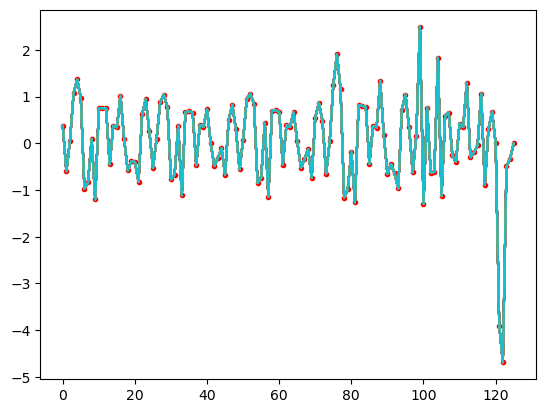

In [43]:
fig, ax = plt.subplots()
ax.plot(phi, 'r.-')
for y in np.linspace(0,1,4):
    for x in np.linspace(0,1,10):
        params = ff_nn(np.array([x,y]).reshape([1,-1]), Lambda_params)
        ax.plot(params[0])

In [44]:
with open('hole_paper_pre.npy', 'wb') as f:
    pickle.dump([coord_2_strain_params, node_params, Lambda_params, mesh, elem_X, Force_x, Force_y, strains,
                 bd_X, lmbx_hist, P_hist_goh, F_hist_goh, t_hist], f)

In [11]:
with open('hole_paper_pre.npy', 'rb') as f:
    coord_2_strain_params, node_params, Lambda_params, mesh, elem_X, Force_x, Force_y, strains,bd_X, lmb_hist, P_hist_goh, F_hist_goh, t_hist=pickle.load(f)

In [20]:
_, unravel = ravel_pytree(node_params)
NODE_w_unravel = lambda params: NODE_model_aniso(unravel(params))
coords_2_strain_nn_ff = lambda x, params: coords_2_strain_nn(x, params)
ff_nn_ff = lambda x, params: ff_nn(x, params)

In [ ]:
def get_P(X, Y, t, Lambda_params, coord_2_strain_params, model):
    F_xx, F_xy, F_yx, F_yy = coords_2_strain_nn_ff(jnp.array([X,Y,t])[None,:], coord_2_strain_params).flatten()
    # get NODE individual-specific params, phi, from the Lambda NN
    Lambda_inp = jnp.array([X,Y]).reshape([-1,2])
    phi = ff_nn_ff(Lambda_inp, Lambda_params).flatten()
    # Make predictions with this NODE
    ugrad = jnp.array([[F_xx-1.0, F_xy],[F_yx, F_yy-1.0]])
    P = ThreeDElasticity(model).ugrad_2_P(ugrad, phi, 2)
    return P[0,0], P[1,0], P[0,1], P[1,1]
get_P_vmap = vmap(get_P, in_axes=(0,0,0,None,None,None), out_axes=(0,0,0,0))

get_Pxx = lambda X, Y, t, a, b, c: get_P(X, Y, t, a, b, c)[0]
get_Pyx = lambda X, Y, t, a, b, c: get_P(X, Y, t, a, b, c)[1]
get_Pxy = lambda X, Y, t, a, b, c: get_P(X, Y, t, a, b, c)[2]
get_Pyy = lambda X, Y, t, a, b, c: get_P(X, Y, t, a, b, c)[3]

Grad_Pxx_X = vmap(grad(get_Pxx, argnums=0), in_axes=(0,0,0,None,None,None), out_axes=0) # should return dsgm_xx/dx
Grad_Pyx_X = vmap(grad(get_Pyx, argnums=0), in_axes=(0,0,0,None,None,None), out_axes=0)
Grad_Pxy_Y = vmap(grad(get_Pyx, argnums=1), in_axes=(0,0,0,None,None,None), out_axes=0)
Grad_Pyy_Y = vmap(grad(get_Pyy, argnums=1), in_axes=(0,0,0,None,None,None), out_axes=0)


#%%
# Train
a1 = 10000
@jit
def loss(Lambda_params, XYt_colloc):

    P_pred = get_P_vmap(XYt_colloc[:,0],XYt_colloc[:,1], XYt_colloc[:,2], Lambda_params, coord_2_strain_params, NODE_w_unravel)
    P_xx = P_xx_mean[jnp.array(XYt_colloc[:,2], int)]
    P_yy = P_yy_mean[jnp.array(XYt_colloc[:,2], int)]

    loss_P = jnp.mean((P_pred[0] - P_xx)**2 + (P_pred[3] - P_yy)**2)
    # loss_F = 0.0
    
    return loss_P

lr = optimizers.exponential_decay(1e-3, 10000, 0.9)
sharding = PositionalSharding(jax.devices()).reshape(n_cores, 1)
opt_init, opt_update, get_params = optimizers.adam(lr) 
opt_state = opt_init(Lambda_params)

node_X_ext = jnp.hstack([mesh.points, t_hist[-1]*np.ones_like(mesh.points[:,:1])])
metric1 = lambda params, X:  bd_forces(params, t_hist[-1], bd_X, coord_2_strain_params, NODE_w_unravel)
metric2 = lambda params, X: divergence(params, node_X_ext, coord_2_strain_params, NODE_w_unravel)

Lambda_params, val_loss, metrics = train_colloc(loss, [mesh.points, t_hist], get_params, opt_update, opt_state, 
                                            key, sharding, 'cross', nIter = 30000, print_freq=1000, batch_size=1000)

In [48]:
with open('hole_paper_second_pretraining.pickle', 'wb') as f:
    pickle.dump([Lambda_params,val_loss, metrics], f)

In [22]:
with open('hole_paper_second_pretraining.pickle', 'rb') as f:
    Lambda_params,val_loss, metrics=pickle.load(f)

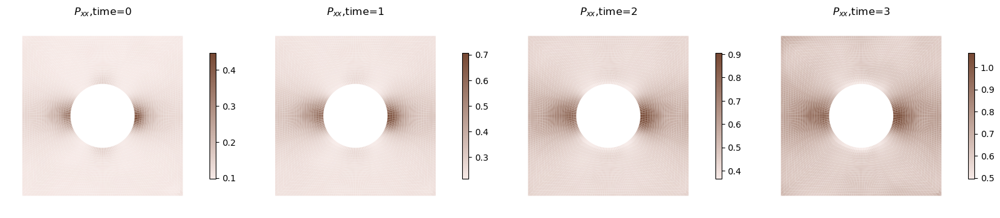

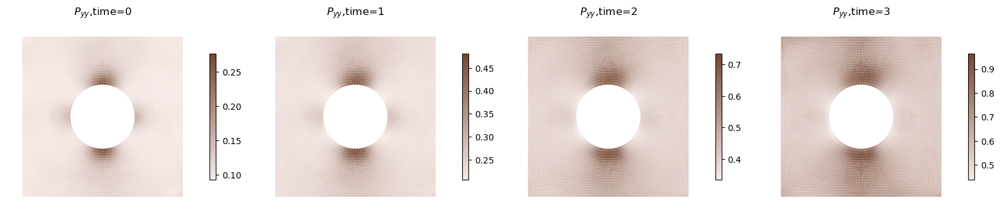

In [23]:
def get_P_pretraining_plot(F, X,Y,Lambda_params, model):
    F_xx=F[0,0]
    F_xy=F[0,1]
    F_yx=F[1,0]
    F_yy=F[1,1]
    #F_xx, F_xy, F_yx, F_yy = coords_2_strain_nn_ff(jnp.array([X,Y,t])[None,:], coord_2_strain_params).flatten()
    # get NODE individual-specific params, phi, from the Lambda NN
    Lambda_inp = jnp.array([X,Y]).reshape([-1,2])
    phi = ff_nn_ff(Lambda_inp, Lambda_params).flatten()
    # Make predictions with this NODE
    ugrad = jnp.array([[F_xx-1.0, F_xy],[F_yx, F_yy-1.0]])
    P = ThreeDElasticity(model).ugrad_2_P(ugrad, phi, 2)
    return P[0,0], P[1,0], P[0,1], P[1,1]
get_P_pretraining_plot_vmap = vmap(get_P_pretraining_plot, in_axes=(0,0,0,None,None), out_axes=(0,0,0,0))
# lmb_hist_plot = [1.02, 1.05, 1.10, 1.15] 
t_hist = len(lmbx_hist )
n_plots = len(lmbx_hist )
n_cols = 4
n_rows = (n_plots + n_cols - 1) // n_cols 
t_hist =np.arange(0, t_hist)
# c_range=np.ones((n_cols,2))
# c_range[:,[0]]=100000*c_range[:,[0]]
# c_range[:,[1]]=-100000*c_range[:,[1]]
ff_nn_ff = lambda x, params: ff_nn(x, params)
_, unravel = ravel_pytree(node_params)
NODE_w_unravel = lambda params: NODE_model_aniso(unravel(params))
id_for_range=0
fig_x, axes_x = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes_x = axes_x.flatten()
fig_y, axes_y = plt.subplots(n_rows, n_cols, figsize=(20, 4 * n_rows))
axes_y = axes_y.flatten()
for lam in lmbx_hist:
    ax_x = axes_x[id_for_range]
    ax_y = axes_y[id_for_range]
    uniform_F= lam *np.eye(2).reshape(1, 2, 2)
    uniform_F_batch= np.repeat(uniform_F, elem_X.shape[0], axis=0)
    P_xx, P_xy,P_yx,P_yy=get_P_pretraining_plot_vmap(uniform_F_batch, elem_X[:,0],elem_X[:,1],Lambda_params,NODE_w_unravel)
    title=fr'$P_{{xx}}$,time={id_for_range}'
    plotmesh(mesh.cells, mesh.points, P_xx,title=title, ax=ax_x,ec='None',cmap=natural_brown_cmap)
    title=fr'$P_{{yy}}$,time={id_for_range}'
    plotmesh(mesh.cells, mesh.points, P_yy,title=title, ax=ax_y,ec='None',cmap=natural_brown_cmap)
    id_for_range+=1

## 2. Retrain

In [ ]:
_, unravel = ravel_pytree(node_params)
NODE_w_unravel = lambda params: NODE_model_aniso(unravel(params))
@partial(jit, static_argnums=(4,))
def bd_forces(Lambda_params, t, bd_X, c2s_params, model):
    rgt_bd_X, top_bd_X, lft_bd_X, bot_bd_X = bd_X
    rgt_bd_P = get_P_vmap(rgt_bd_X[:,0], rgt_bd_X[:,1], t*jnp.ones_like(rgt_bd_X[:,0]), Lambda_params, c2s_params, model)
    top_bd_P = get_P_vmap(top_bd_X[:,0], top_bd_X[:,1], t*jnp.ones_like(top_bd_X[:,0]), Lambda_params, c2s_params, model)
    lft_bd_P = get_P_vmap(lft_bd_X[:,0], lft_bd_X[:,1], t*jnp.ones_like(lft_bd_X[:,0]), Lambda_params, c2s_params, model)
    bot_bd_P = get_P_vmap(bot_bd_X[:,0], bot_bd_X[:,1], t*jnp.ones_like(bot_bd_X[:,0]), Lambda_params, c2s_params, model)
    hole_bd_P=get_P_vmap(pts2d[hole['hole'],0], pts2d[hole['hole'],1], t * jnp.ones_like(pts2d[hole['hole'], 0]), Lambda_params, c2s_params, model)
    pts2d_hole_cc=pts2d[hole['hole'],:]-jnp.array([[Lx/2,Ly/2]])
    pts2d_hole_n=-pts2d_hole_cc/jnp.linalg.norm(pts2d_hole_cc, axis=1, keepdims=True) 
    pts2d_hole_tx=hole_bd_P[0]*pts2d_hole_n[:,0]+hole_bd_P[2]*pts2d_hole_n[:,1]
    pts2d_hole_ty=hole_bd_P[1]*pts2d_hole_n[:,0]+hole_bd_P[3]*pts2d_hole_n[:,1]
    pts2d_hole_t_norm_sum=.5*jnp.sum(jnp.sqrt(pts2d_hole_tx**2+pts2d_hole_ty**2))
    rgt_bd_frc = jnp.sum(rgt_bd_P[0]*rgt_bd_lengths) # Assume area of edge = 1.0
    top_bd_frc = jnp.sum(top_bd_P[3]*top_bd_lengths)
    lft_bd_frc = jnp.sum(lft_bd_P[0]*lft_bd_lengths)
    bot_bd_frc = jnp.sum(bot_bd_P[3]*bot_bd_lengths)
    return rgt_bd_frc, top_bd_frc, lft_bd_frc, bot_bd_frc,pts2d_hole_t_norm_sum
# Train
a1 = 500
@jit
def loss(Lambda_params, XYt_colloc):
    Div_x, Div_y = divergence(Lambda_params, XYt_colloc, coord_2_strain_params, NODE_w_unravel)
    loss_Div = a1*(Div_x**2 + Div_y**2)

    def bd_forces_loss(_, t):
        F_rgt, F_top, F_lft, F_bot,F_radial = bd_forces(Lambda_params, t, bd_X, coord_2_strain_params, NODE_w_unravel)
        Fx = Force_x[jnp.array(t, int)]
        Fy = Force_y[jnp.array(t, int)]
        return None, a2*((F_rgt-Fx)**2 + (F_top-Fy)**2 + (F_lft-Fx)**2 + (F_bot-Fy)**2+F_radial **2)
    loss_F = jnp.mean(scan(bd_forces_loss, init=None, xs=t_hist)[1])
    # loss_F = 0.0
    
    return loss_Div + loss_F

lr = 1e-4
sharding = PositionalSharding(jax.devices()).reshape(n_cores, 1)
opt_init, opt_update, get_params = optimizers.adam(lr) 
opt_state = opt_init(Lambda_params)

node_X_ext = jnp.hstack([mesh.points, t_hist[-1]*np.ones_like(mesh.points[:,:1])])
metric1 = lambda params, X:  bd_forces(params, t_hist[-1], bd_X, coord_2_strain_params, NODE_w_unravel)
metric2 = lambda params, X: divergence(params, node_X_ext, coord_2_strain_params, NODE_w_unravel)

Lambda_params, val_loss, metrics = train_colloc(loss, [mesh.points, t_hist], get_params, opt_update, opt_state, 
                                            key, sharding, 'cross', nIter = 40000, print_freq=1000, batch_size=2000)

with open('hole_paper_strong_format_post_500_epoch_40000.npy', 'wb') as f:
    pickle.dump([mesh, elem_X, strains, Force_x, Force_y, node_params, Lambda_params, val_loss, metrics, t_hist, lmb_hist], f)

2025-10-12 01:16:19.441970: E external/xla/xla/service/slow_operation_alarm.cc:65] 
********************************
[Compiling module jit_step_colloc] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************
2025-10-12 01:18:51.992117: E external/xla/xla/service/slow_operation_alarm.cc:133] The operation took 4m32.549028479s

********************************
[Compiling module jit_step_colloc] Very slow compile? If you want to file a bug, run with envvar XLA_FLAGS=--xla_dump_to=/tmp/foo and attach the results.
********************************


it 1, val loss = 9.444505e+02
it 1001, val loss = 4.491227e-01
it 2001, val loss = 3.679642e-01
it 3001, val loss = 5.076356e-01
it 4001, val loss = 5.127317e-01
it 5001, val loss = 5.978824e-01
it 6001, val loss = 3.269065e-01
it 7001, val loss = 6.029297e-01
it 8001, val loss = 1.951157e-01
it 9001, val loss = 9.802682e-02
it 10001, val loss = 2.148894e-01
it 11001, val loss = 1.264721e-01
it 12001, val loss = 2.032860e-01
it 13001, val loss = 2.916497e-01
it 14001, val loss = 1.331515e-01
it 15001, val loss = 3.608981e-01
it 16001, val loss = 2.611814e-01
it 17001, val loss = 2.467452e-01
it 18001, val loss = 1.373400e-01
it 19001, val loss = 1.468752e-01
it 20001, val loss = 7.476860e-02
it 21001, val loss = 7.967629e-02
it 22001, val loss = 5.953965e-02
it 23001, val loss = 1.293643e-01
it 24001, val loss = 1.432863e-01
it 25001, val loss = 8.319417e-02
it 26001, val loss = 1.420996e-01
it 27001, val loss = 8.252076e-02
it 28001, val loss = 1.116015e-01
it 29001, val loss = 6.4674

## 3. Test

In [ ]:
with open('hole_paper_strong_format_post_500_epoch_40000.npy', 'rb') as f:
    mesh, elem_X, strains, Force_x, Force_y, node_params, Lambda_params, val_loss, metrics, t_hist, lmb_hist = pickle.load(f)
_, unravel = ravel_pytree(node_params)
NODE_w_unravel = lambda params: NODE_model_aniso(unravel(params))

In [37]:
# Stiffness across the domain
range_minmax=np.zeros((2,4))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    ugrad = jnp.array([[lmb-1.0, 0.0], [0.0, lmb-1.0]])

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)

    c_elem_gt = []
    c_elem_pr = []
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[0,0])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[0,0])
    range_minmax[0,id_f]=np.array([np.array(c_elem_pr).min(),np.array(c_elem_gt).min()]).min()
    range_minmax[1,id_f]=np.array([np.array(c_elem_pr).max(),np.array(c_elem_gt).max()]).max()
    id_f+=1

0.007410742863370123
0.11557765421570994
0.05537636178678641
0.27180966071499224
0.1339627494921169
0.5085105373339841
0.19712393986346677
0.7564627793334621


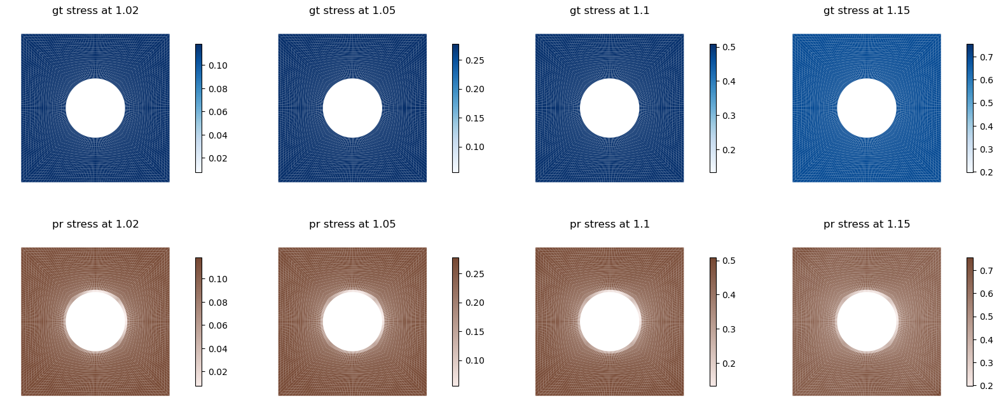

In [38]:
# Stiffness across the domain
fig, axes = plt.subplots(2,4,figsize=(20,8))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    ugrad = jnp.array([[lmb-1.0, 0.0], [0.0, lmb-1.0]])

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)

    c_elem_gt = []
    c_elem_pr = []
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[0,0])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[0,0])
    plotmesh_updated(mesh.cells, mesh.points, c_elem_gt, range_minmax[0,id_f],range_minmax[1,id_f], title='gt stress at {}'.format(str(lmb)), ax=ax[0],ec='None')
    extent = [np.min(c_elem_gt), np.max(c_elem_gt)]
    if extent[0] > np.min(c_elem_pr) and extent[1] < np.max(c_elem_pr):
        extend='both'
    elif extent[0] > np.min(c_elem_pr):
        extend='min'
    elif extent[1] < np.max(c_elem_pr):
        extend='max'
    print(np.array(c_elem_pr).min())
    print(np.array(c_elem_pr).max())
    plotmesh_updated(mesh.cells, mesh.points, c_elem_pr, range_minmax[0, id_f],range_minmax[1,id_f],title=f'pr stress at {lmb}', ax=ax[1],ec='None',cmap=natural_brown_cmap)
    id_f+=1

##### plots of P's wrt F(X,t)

In [39]:
range_minmax=np.zeros((2,4))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[0,0])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[0,0])
        id_elem+=1
    range_minmax[0,id_f]=np.array([np.array(c_elem_pr).min(),np.array(c_elem_gt).min()]).min()
    range_minmax[1,id_f]=np.array([np.array(c_elem_pr).max(),np.array(c_elem_gt).max()]).max()
    id_f+=1
 

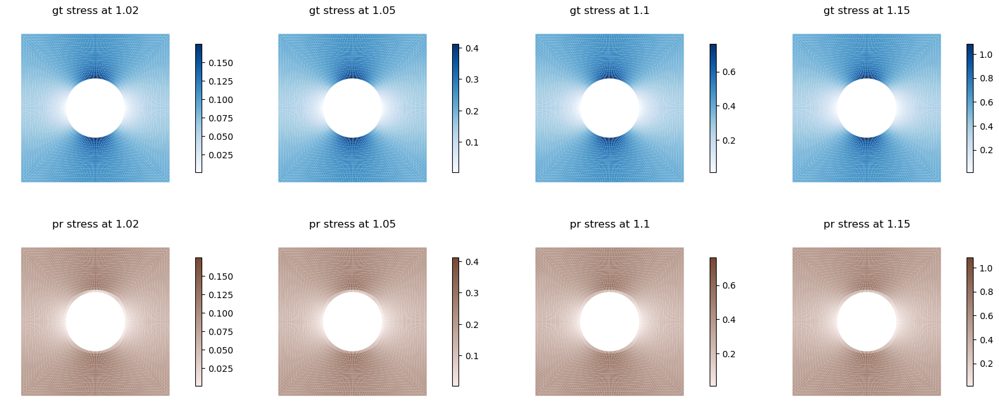

In [40]:

natural_brown_cmap = LinearSegmentedColormap.from_list(
    "natural_brown",
    [ "#f7eae7", "#754732" ],  # dark brown → light brown → pale peach
    N=256)
fig, axes = plt.subplots(2,4,figsize=(20,8))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[0,0])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[0,0])
        id_elem+=1
    plotmesh_updated(mesh.cells, mesh.points, c_elem_gt, range_minmax[0,id_f],range_minmax[1,id_f], title='gt stress at {}'.format(str(lmb)), ax=ax[0],ec='None'); 
    extent = [np.min(c_elem_gt), np.max(c_elem_gt)]
    if extent[0] > np.min(c_elem_pr) and extent[1] < np.max(c_elem_pr):
        extend='both'
    elif extent[0] > np.min(c_elem_pr):
        extend='min'
    elif extent[1] < np.max(c_elem_pr):
        extend='max'
    #plotmesh(mesh.cells, mesh.points, c_elem_pr, title='pr stress at {}'.format(str(lmb)), ax=ax[1], extent=extent, extend=extend,ec='None');
    plotmesh_updated(mesh.cells, mesh.points, c_elem_pr, range_minmax[0, id_f],range_minmax[1,id_f],title=f'pr stress at {lmb}', ax=ax[1],ec='None',cmap=natural_brown_cmap)
    id_f+=1
 

In [41]:
range_minmax=np.zeros((2,4))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[1,1])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[1,1])
        id_elem+=1
    range_minmax[0,id_f]=np.array([np.array(c_elem_pr).min(),np.array(c_elem_gt).min()]).min()
    range_minmax[1,id_f]=np.array([np.array(c_elem_pr).max(),np.array(c_elem_gt).max()]).max()
    id_f+=1
 

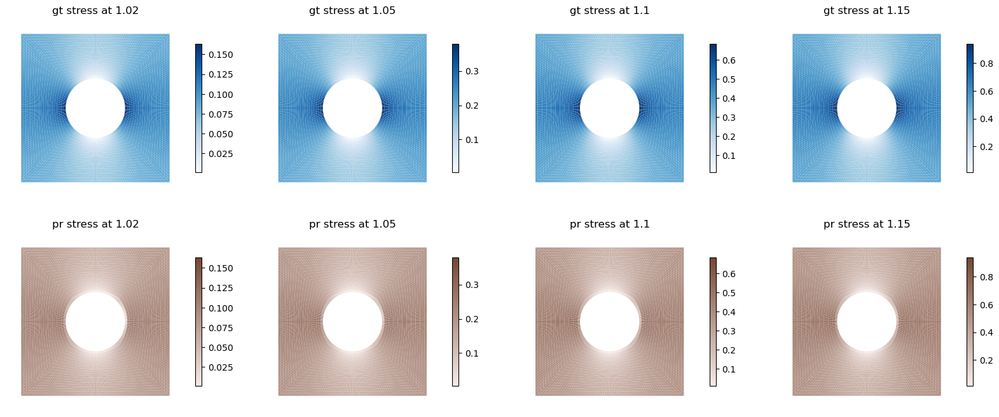

In [42]:

natural_brown_cmap = LinearSegmentedColormap.from_list(
    "natural_brown",
    [ "#f7eae7", "#754732" ],  # dark brown → light brown → pale peach
    N=256)
fig, axes = plt.subplots(2,4,figsize=(20,8))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[1,1])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[1,1])
        id_elem+=1
    
    plotmesh_updated(mesh.cells, mesh.points, c_elem_gt, range_minmax[0,id_f],range_minmax[1,id_f], title='gt stress at {}'.format(str(lmb)), ax=ax[0],ec='None'); 
    extent = [np.min(c_elem_gt), np.max(c_elem_gt)]
    if extent[0] > np.min(c_elem_pr) and extent[1] < np.max(c_elem_pr):
        extend='both'
    elif extent[0] > np.min(c_elem_pr):
        extend='min'
    elif extent[1] < np.max(c_elem_pr):
        extend='max'
    #plotmesh(mesh.cells, mesh.points, c_elem_pr, title='pr stress at {}'.format(str(lmb)), ax=ax[1], extent=extent, extend=extend,ec='None');
    plotmesh_updated(mesh.cells, mesh.points, c_elem_pr, range_minmax[0, id_f],range_minmax[1,id_f],title=f'pr stress at {lmb}', ax=ax[1],ec='None',cmap=natural_brown_cmap)
    id_f+=1

In [43]:
range_minmax=np.zeros((2,4))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[0,1])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[0,1])
        id_elem+=1
    range_minmax[0,id_f]=np.array([np.array(c_elem_pr).min(),np.array(c_elem_gt).min()]).min()
    range_minmax[1,id_f]=np.array([np.array(c_elem_pr).max(),np.array(c_elem_gt).max()]).max()
    id_f+=1
 

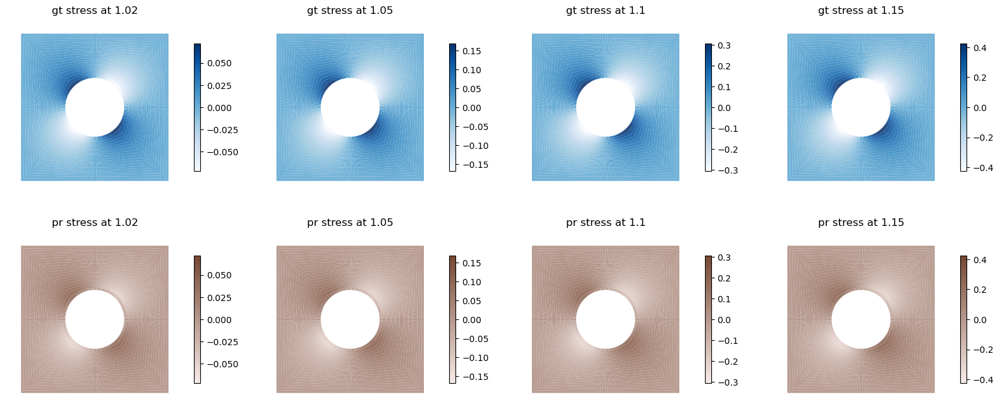

In [44]:

natural_brown_cmap = LinearSegmentedColormap.from_list(
    "natural_brown",
    [ "#f7eae7", "#754732" ],  # dark brown → light brown → pale peach
    N=256)
fig, axes = plt.subplots(2,4,figsize=(20,8))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[0,1])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[0,1])
        id_elem+=1
    
    plotmesh_updated(mesh.cells, mesh.points, c_elem_gt, range_minmax[0,id_f],range_minmax[1,id_f], title='gt stress at {}'.format(str(lmb)), ax=ax[0],ec='None'); 
    extent = [np.min(c_elem_gt), np.max(c_elem_gt)]
    if extent[0] > np.min(c_elem_pr) and extent[1] < np.max(c_elem_pr):
        extend='both'
    elif extent[0] > np.min(c_elem_pr):
        extend='min'
    elif extent[1] < np.max(c_elem_pr):
        extend='max'
    #plotmesh(mesh.cells, mesh.points, c_elem_pr, title='pr stress at {}'.format(str(lmb)), ax=ax[1], extent=extent, extend=extend,ec='None');
    plotmesh_updated(mesh.cells, mesh.points, c_elem_pr, range_minmax[0, id_f],range_minmax[1,id_f],title=f'pr stress at {lmb}', ax=ax[1],ec='None',cmap=natural_brown_cmap)
    id_f+=1

In [45]:
range_minmax=np.zeros((2,4))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[1,0])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[1,0])
        id_elem+=1
    range_minmax[0,id_f]=np.array([np.array(c_elem_pr).min(),np.array(c_elem_gt).min()]).min()
    range_minmax[1,id_f]=np.array([np.array(c_elem_pr).max(),np.array(c_elem_gt).max()]).max()
    id_f+=1
 

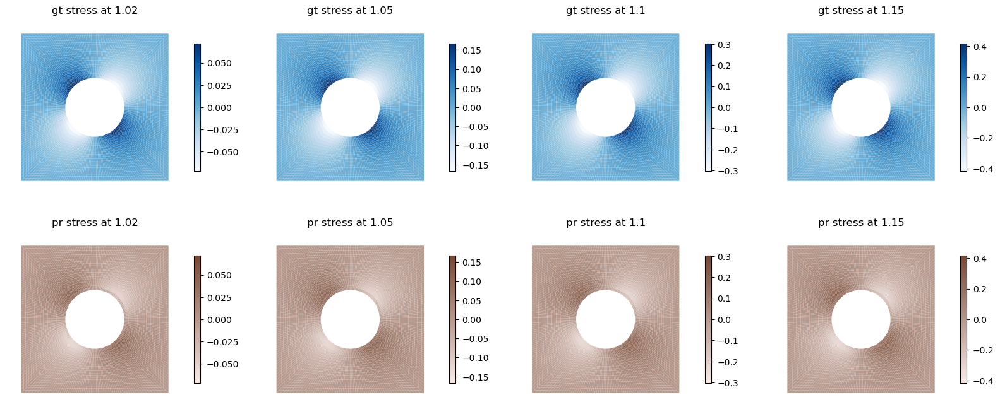

In [46]:

natural_brown_cmap = LinearSegmentedColormap.from_list(
    "natural_brown",
    [ "#f7eae7", "#754732" ],  # dark brown → light brown → pale peach
    N=256)
fig, axes = plt.subplots(2,4,figsize=(20,8))
id_f=0
for lmb, ax in zip(lmbx_hist, axes.T):
    F=F_hist_goh[id_f]

    params_gt = []
    for xy in elem_X:
        params_gt.append(coords_2_params_gt(xy))
    params_gt = np.array(params_gt)
    params_pr = ff_nn(elem_X, Lambda_params)
    # E = E_fun(F)
    # evals, efuns = jnp.linalg.eigh(E)
    # print(evals.shape)
    E_11, E_22 = evals.T
    c_elem_gt = []
    c_elem_pr = []
    id_elem=0
    for params_gt_i, params_pr_i in zip(params_gt, params_pr):
        ugrad=jnp.squeeze(F[id_elem,:,:])-jnp.eye(2)
        c_elem_gt.append(ThreeDElasticity(GOH_model).ugrad_2_P(ugrad, params_gt_i, 2)[1,0])
        c_elem_pr.append(ThreeDElasticity(NODE_w_unravel).ugrad_2_P(ugrad, params_pr_i, 2)[1,0])
        id_elem+=1
    
    plotmesh_updated(mesh.cells, mesh.points, c_elem_gt, range_minmax[0,id_f],range_minmax[1,id_f], title='gt stress at {}'.format(str(lmb)), ax=ax[0],ec='None'); 
    extent = [np.min(c_elem_gt), np.max(c_elem_gt)]
    if extent[0] > np.min(c_elem_pr) and extent[1] < np.max(c_elem_pr):
        extend='both'
    elif extent[0] > np.min(c_elem_pr):
        extend='min'
    elif extent[1] < np.max(c_elem_pr):
        extend='max'
    #plotmesh(mesh.cells, mesh.points, c_elem_pr, title='pr stress at {}'.format(str(lmb)), ax=ax[1], extent=extent, extend=extend,ec='None');
    plotmesh_updated(mesh.cells, mesh.points, c_elem_pr, range_minmax[0, id_f],range_minmax[1,id_f],title=f'pr stress at {lmb}', ax=ax[1],ec='None',cmap=natural_brown_cmap)
    id_f+=1